In [1]:
# Imports list
import joblib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.decomposition import NMF
from sklearn.preprocessing import MinMaxScaler

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.neighbors import LocalOutlierFactor
from sklearn.decomposition import PCA

from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.metrics import silhouette_score

from minisom import MiniSom

from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors
from matplotlib.colors import LinearSegmentedColormap

from matplotlib.lines import Line2D
import seaborn as sns

from matplotlib import __version__ as mplver

from sklearn.impute import KNNImputer
from sklearn.metrics import root_mean_squared_error

In [2]:
# Style is importantuntitled:Untitled-1.ipynb?jupyter-notebook
sns.set(style="white")

# Ensuring pandas always prints all columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_seq_items', None)
pd.set_option('display.max_colwidth', 1000)

%config InlineBackend.figure_format = 'retina'

In [3]:
path = '../../data/'

In [4]:
# Reading the csv data
# data = pd.read_csv(f'{path}all_customers_preproc.csv', index_col=0)

regulars = pd.read_csv(f'{path}regulars_preproc.csv', index_col=0)

In [5]:
# Hour of day variables
hour_features = regulars.columns[28:52].to_list()

# Day of week variables
day_features = regulars.columns[21:28].to_list()

In [6]:
# Load the scaler
scaler = joblib.load('std_scaler.pkl')

In [7]:
numeric = [
    'cust_age', 'n_vendor', 'n_product', 'n_chain', 'first_order',
    'last_order', 'american', 'asian', 'beverages', 'cafe',
    'chicken_dishes', 'chinese', 'desserts', 'healthy', 'indian', 'italian',
    'japanese', 'noodle_dishes', 'other', 'street_food_snacks', 'thai',
    'DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0',
    'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9',
    'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17',
    'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'total_amt',
    'n_order', 'avg_amt_per_product', 'avg_amt_per_order',
    'avg_amt_per_vendor', 'days_cust', 'avg_days_to_order', 'days_due',
    'per_chain_order', 'n_days_week', 'n_times_day', 'n_cuisines',
    'log_n_vendor', 'log_n_product', 'log_n_chain', 'log_american',
    'log_asian', 'log_beverages', 'log_cafe', 'log_chicken_dishes',
    'log_chinese', 'log_desserts', 'log_healthy', 'log_indian',
    'log_italian', 'log_japanese', 'log_noodle_dishes', 'log_other',
    'log_street_food_snacks', 'log_thai', 'log_total_amt', 'log_n_order',
    'log_avg_amt_per_product', 'log_avg_amt_per_order',
    'log_avg_amt_per_vendor', 'log_n_days_week', 'log_n_times_day',
    'avg_amt_per_day', 'avg_product_per_day', 'avg_order_per_day'
]

In [8]:
regulars = pd.concat([
    pd.DataFrame(scaler.inverse_transform(regulars[numeric]), columns=numeric, index=regulars.index)
    ,regulars.drop(columns=numeric)
], axis=1)

In [9]:
time_factors_df = regulars[hour_features + day_features].copy()
n_components_gmm = 2

In [10]:
# Preprocess the data (Standardize it)
scaler = MinMaxScaler().set_output(transform='pandas')
time_factors_df = scaler.fit_transform(time_factors_df)

In [11]:
time_factors_df.head()

,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
103287041752,0.0,0.000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.00,0.000000,0.0,0.071429,0.0,0.0,0.142857,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0.0,0.076923
338018592517,0.0,0.000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.05,0.076923,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0.0,0.076923
459279132454,0.0,0.125,0.0,0.090909,0.0,0.0,0.000000,0.0,0.00,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0.0,0.076923
568914241263,0.0,0.000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.00,0.000000,0.0,0.071429,0.0,0.0,0.000000,0.000000,0.0,0.076923,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0.0,0.076923
1043496422503,0.0,0.000,0.0,0.000000,0.0,0.0,0.166667,0.0,0.00,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.076923,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0.0,0.076923


In [12]:
# Apply NMF to extract 15 factors
nmf = NMF(n_components=6, init='random', random_state=0, solver='mu', beta_loss='kullback-leibler', max_iter=1000)
W = nmf.fit_transform(time_factors_df).round(decimals=3) # Customer-factor matrix
H = nmf.components_.round(decimals=3)  # Cuisine-factor matrix

# Create a DataFrame for W, and H with appropriate row and column names
H_df = pd.DataFrame(H, columns=time_factors_df.columns, index=[f"Factor_{i+1}" for i in range(H.shape[0])])
W_df = pd.DataFrame(W, columns=[f"Factor_{i+1}" for i in range(W.shape[1])], index=regulars.index)

In [13]:
W_df.head()

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6
customer_id,,,,,,
103287041752,0.000,0.091,0.147,0.000,0.0,0.0
338018592517,0.000,0.174,0.000,0.000,0.0,0.0
459279132454,0.088,0.000,0.151,0.000,0.0,0.0
568914241263,0.000,0.098,0.000,0.067,0.0,0.0
1043496422503,0.152,0.000,0.000,0.070,0.0,0.0


In [14]:
H_df

,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6
Factor_1,0.019,0.000,0.114,0.162,0.187,0.176,0.169,0.183,0.023,0.00,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.147,0.093,0.095,0.000,0.110,0.091,0.082
Factor_2,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.060,0.23,0.212,0.344,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.160,0.180,0.000,0.192,0.127,0.148
Factor_3,0.062,0.105,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.00,0.493,0.000,0.000,0.000,0.000,0.000,0.000,0.193,0.062,0.119,0.000,0.087,0.089,0.000,0.098,0.107,0.116
Factor_4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.00,0.000,0.285,0.372,0.405,0.100,0.000,0.000,0.000,0.000,0.000,0.000,0.141,0.168,0.000,0.300,0.204,0.211
Factor_5,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.061,0.047,0.206,0.000,0.000,0.000,0.652,0.036,0.000,0.801,0.000,0.000,0.000
Factor_6,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.009,0.309,0.36,0.000,0.000,0.000,0.000,0.095,0.215,0.000,0.000,0.000,0.000,0.000,0.138,0.148,0.000,0.230,0.166,0.194


In [15]:
columns_to_add = ['transaction_volume', 'interaction_rate', 'total_amt']  # Replace with your column names
additional_data = regulars[columns_to_add]  # Extract the desired columns
additional_data = scaler.fit_transform(additional_data)

# Concatenate the transformed data with the additional columns
final_df = pd.concat([W_df, additional_data], axis=1)

# Display the result
print("\nFinal DataFrame after Concatenation:")
print(final_df.head())


Final DataFrame after Concatenation:
               Factor_1  Factor_2  Factor_3  Factor_4  Factor_5  Factor_6  \
customer_id                                                                 
103287041752      0.000     0.091     0.147     0.000       0.0       0.0   
338018592517      0.000     0.174     0.000     0.000       0.0       0.0   
459279132454      0.088     0.000     0.151     0.000       0.0       0.0   
568914241263      0.000     0.098     0.000     0.067       0.0       0.0   
1043496422503     0.152     0.000     0.000     0.070       0.0       0.0   

               transaction_volume  interaction_rate  total_amt  
customer_id                                                     
103287041752             0.428607          0.177060   0.067869  
338018592517             0.647713          0.100409   0.119998  
459279132454             0.345197          0.201729   0.053374  
568914241263             0.258824          0.246849   0.015150  
1043496422503            0.45105

In [16]:
from sklearn.mixture import GaussianMixture

# Step 1: Fit a Gaussian Mixture Model
gmm = GaussianMixture(n_components=n_components_gmm, random_state=0)
gmm_labels = gmm.fit_predict(final_df)

# Add GMM labels to the DataFrame
final_df['cluster'] = gmm_labels

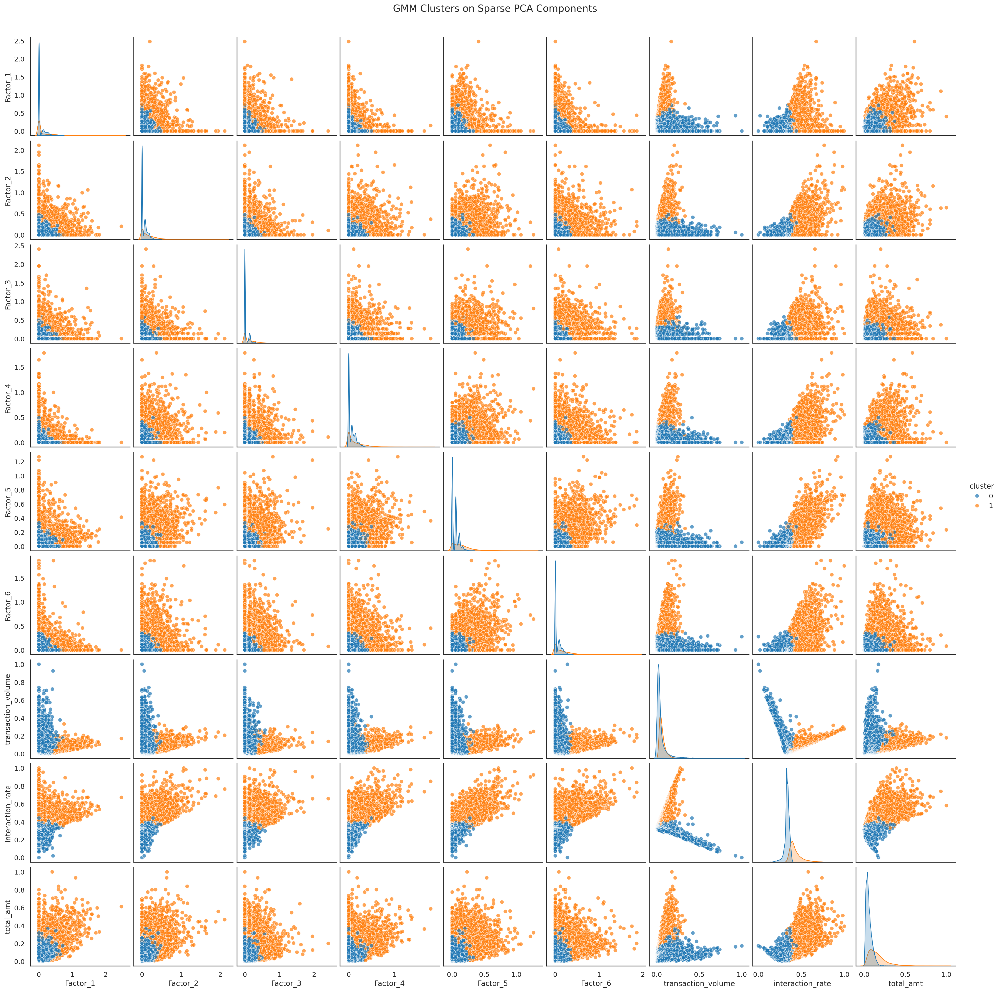

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pairplot of GMM clusters
sns.pairplot(
    final_df,
    hue='cluster',  # Color by cluster
    palette='tab10',  # Use a distinct color palette
    diag_kind='kde',  # Include KDE plots on the diagonal
    plot_kws={'alpha': 0.7, 's': 40},  # Adjust scatter plot transparency and size
)

# Add a title
plt.suptitle("GMM Clusters on Sparse PCA Components", y=1.02, fontsize=16)

# Show the plot
plt.show()

In [18]:
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(final_df.drop(columns='cluster'))  # get total sum of squares
ssw_labels = final_df.groupby(by='cluster').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
r2

/tmp/ipykernel_6811/1689455065.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ssw_labels = final_df.groupby(by='cluster').apply(get_ss)  # compute ssw for each cluster labels


0.13831445679680404

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mpl_colors
import matplotlib.cm as cm
from matplotlib import colorbar
from matplotlib.patches import RegularPolygon
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from minisom import MiniSom

som_data = final_df.values

# Define SOM parameters
M = 6
N = 6
n_feats = final_df.shape[1] 
learning_rate = 0.05
topology = 'hexagonal'
neighborhood_function = 'gaussian'
activation_distance = 'euclidean'
sigma_decay_function = 'linear_decay_to_one'


# Initialize the SOM
sm = MiniSom(M, N,              # SOM map size
             n_feats,           # Number of features
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance=activation_distance,
             sigma_decay_function=sigma_decay_function,
             random_seed=42
             )

# Initialize weights randomly from the data
sm.random_weights_init(som_data)

# Print SOM quantization and topographic errors before training
print("Before training:")
print("QE:", np.round(sm.quantization_error(som_data), 4))
print("TE:", np.round(sm.topographic_error(som_data), 4))

# Train the SOM
sm.train_batch(data=som_data, num_iteration=100000)

# Print SOM quantization and topographic errors after training
print("After training:")
print("QE:", np.round(sm.quantization_error(som_data), 4))
print("TE:", np.round(sm.topographic_error(som_data), 4))

# Get weights
weights = sm.get_weights()
print("Weights shape:", weights.shape)

Before training:
QE: 0.1806
TE: 0.911
After training:
QE: 0.2081
TE: 0.0624
Weights shape: (6, 6, 10)


In [27]:
def plot_hexagons(som,              # Trained SOM model 
                  sf,               # matplotlib figure object
                  colornorm,        # colornorm
                  matrix_vals,      # SOM weights or
                  label="",         # title for figure
                  cmap=cm.Grays,    # colormap to use
                  annot=False       
                  ):

    axs = sf.subplots(1, 1)
    
    for i in range(matrix_vals.shape[0]):
        for j in range(matrix_vals.shape[1]):

            # Convert SOM map coordinates to Euclidean coordinates
            wx, wy = som.convert_map_to_euclidean((i, j)) 

            # Create the hexagon patch
            hex = RegularPolygon((wx, wy), 
                                 numVertices=6, 
                                 radius=np.sqrt(1 / 3),
                                 facecolor=cmap(colornorm(matrix_vals[i, j])), 
                                 alpha=1, 
                                 edgecolor='white',
                                 linewidth=0.5)
            axs.add_patch(hex)
            
            # Add annotations inside the hexagons if 'annot' is True
            if annot:
                annot_val = np.round(matrix_vals[i, j], 2)
                if int(annot_val) == annot_val:
                    annot_val = int(annot_val)
                axs.text(wx, wy, annot_val, 
                         ha='center', va='center', 
                         fontsize=5)

    # Remove axes and set the plot appearance
    axs.margins(0.05)
    axs.set_aspect('equal')
    axs.axis("off")
    axs.set_title(label)

    # Add colorbar
    divider = make_axes_locatable(axs)
    ax_cb = divider.append_axes("right", size="5%", pad="0%")

    # Create colorbar mappable object
    cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
    cmap_sm.set_array([])

    # Create custom colorbar
    cb1 = colorbar.Colorbar(ax_cb,
                            orientation='vertical', 
                            alpha=1,
                            mappable=cmap_sm)
    cb1.ax.get_yaxis().labelpad = 6

    # Add colorbar axis to the plot
    sf.add_axes(ax_cb)

    return sf

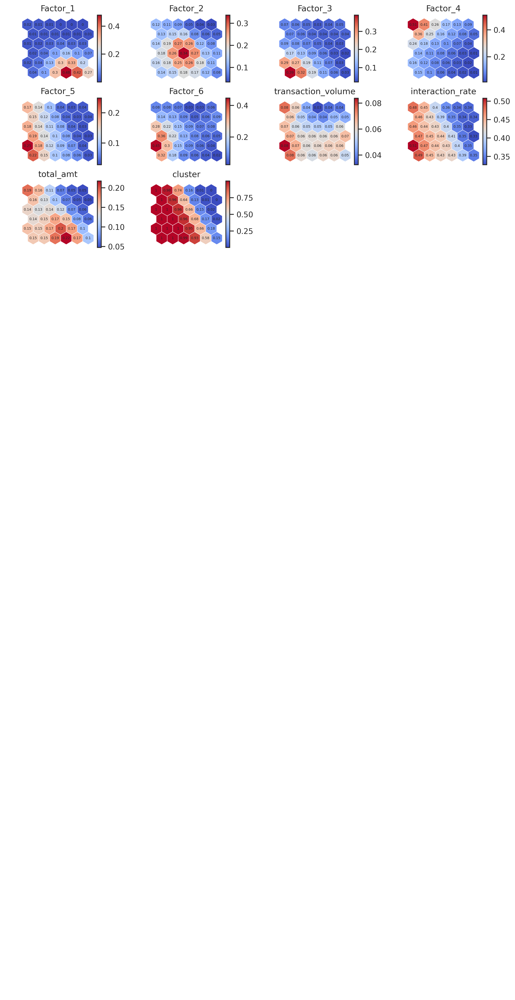

In [28]:
# Plot Component Planes
figsize = (10, 20)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128)

# Create a grid of subfigures to plot component planes
subfigs = fig.subfigures(12, 4, wspace=0.15)

# Plot each component plane
for cpi, sf in zip(range(final_df.shape[1]), subfigs.flatten()):
    matrix_vals = weights[:, :, cpi]
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))
    sf = plot_hexagons(sm, sf, 
                       colornorm,
                       matrix_vals,
                       label=final_df.columns[cpi],  # Use column names from final_df
                       cmap=cm.coolwarm,
                       annot=True)  # Set annot=True to show annotations



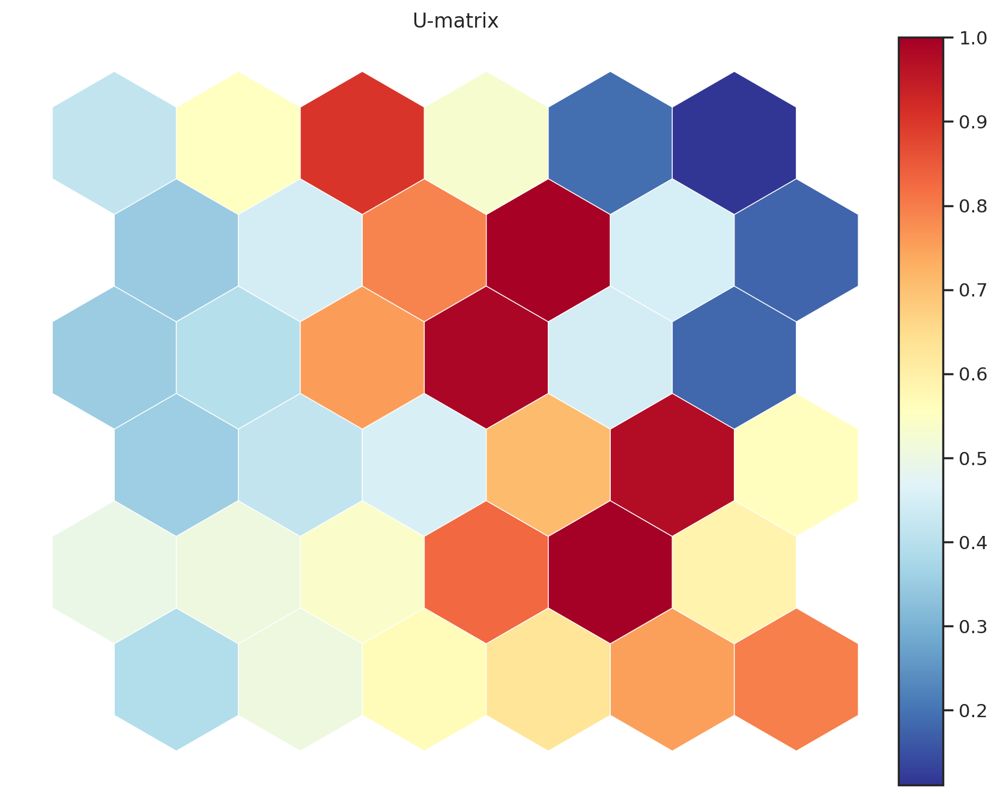

In [29]:
# Plot the U-matrix
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

# Plot U-matrix using hexagonal plot
fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r)


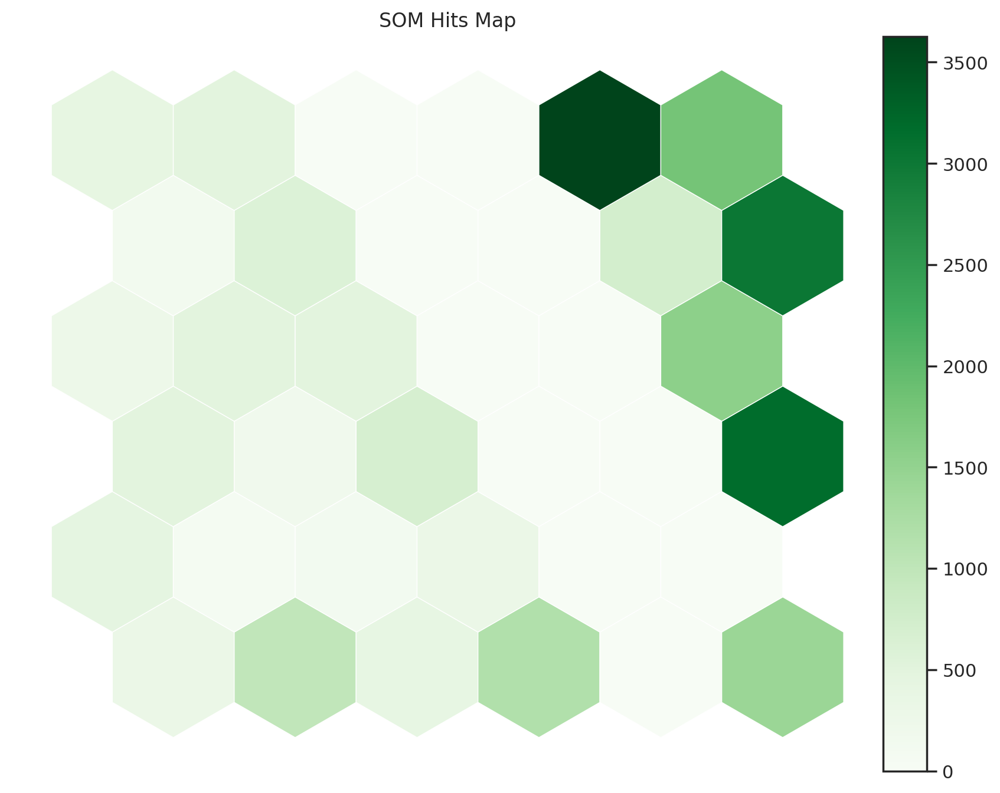

In [30]:
# Plot the SOM Hits Map
hitsmatrix = sm.activation_response(final_df.values)

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

# Plot Hits Map using hexagonal plot
fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens)

In [31]:
# Quantization error calculation (optional)
quant_error = sm.quantization_error(final_df.values)

In [32]:
quant_error

0.20806447979243473

In [33]:
# Flatten weights for analysis or further processing
weights_flat = sm.get_weights().reshape((M * N), len(final_df.columns))
# Output the flattened weight1s shape
print("Flattened weights shape:", weights_flat.shape)

Flattened weights shape: (36, 10)
